In [1]:
#pip install plotly

In [2]:
#pip install folium

In [3]:
#pip install tensorflow

In [4]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [5]:
import plotly
import folium
import warnings
import Bio.SeqIO
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import plotly.express as px
import plotly.offline as py
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from datetime import date
from Bio import pairwise2
from Bio.Data import CodonTable
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest,f_classif
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot, plot_mpl

warnings.filterwarnings('ignore')
init_notebook_mode(connected=True)
plt.rcParams.update({'font.size': 14})

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/Bio/pairwise2.py:278: BiopythonDeprecationWarning:

Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.



In [6]:
confirmed_df = pd.read_csv("data/time_series_covid_19_confirmed.csv")
deaths_df = pd.read_csv('data/time_series_covid_19_deaths.csv')
recoveries_df = pd.read_csv('data/time_series_covid_19_recovered.csv')

In [7]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,64575,65080,65486,65728,66275,66903,67743,68366,69130,70111
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132118,132153,132176,132209,132215,132229,132244,132264,132285,132297
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,126156,126434,126651,126860,127107,127361,127646,127926,128198,128456
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13569,13569,13569,13569,13569,13664,13671,13682,13693,13693
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,31661,31909,32149,32441,32623,32933,33338,33607,33944,34180


In [8]:
deaths_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,2772,2782,2792,2802,2812,2836,2855,2869,2881,2899
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2440,2441,2442,2444,2445,2447,2447,2447,2448,2449
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,3401,3405,3411,3418,3426,3433,3440,3448,3455,3460
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,127,127,127,127,127,127,127,127,127,127
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,704,709,715,725,731,735,742,745,749,757


In [9]:
recoveries_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,55687,55790,55889,56035,56295,56518,56711,56962,57119,57281
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,127869,128425,128601,128732,128826,128907,128978,129042,129097,129215
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,87902,88066,88208,88346,88497,88672,88861,89040,89232,89419
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,13234,13234,13234,13234,13234,13263,13381,13405,13416,13416
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,26483,26513,26775,26778,27087,27204,27467,27529,27577,27646


In [10]:
na_columns = (confirmed_df.isna().sum() / confirmed_df.shape[0]) > 0.99
na_columns = na_columns[na_columns]
confirmed_df = confirmed_df.drop(na_columns.index, axis=1)
deaths_df = deaths_df.drop(na_columns.index, axis=1)
recoveries_df = recoveries_df.drop(na_columns.index, axis=1)

In [11]:
confirmed_df = confirmed_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='confirmed')
deaths_df = deaths_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='deaths')
recoveries_df = recoveries_df.melt(id_vars=['Country/Region', 'Province/State', 'Lat', 'Long'], var_name='date', value_name='recoveries')
confirmed_df['date'] = pd.to_datetime(confirmed_df['date'])
deaths_df['date'] = pd.to_datetime(deaths_df['date'])
recoveries_df['date'] = pd.to_datetime(recoveries_df['date'])

In [12]:
full_df = confirmed_df.merge(recoveries_df).merge(deaths_df)
full_df = full_df.rename(columns={'Country/Region': 'Country', 'date': 'Date', 'confirmed': "Confirmed", "recoveries": "Recoveries", "deaths": "Deaths"})
world_df = full_df.groupby(['Date']).agg({'Confirmed': ['sum'], 'Recoveries': ['sum'], 'Deaths': ['sum']}).reset_index()
world_df.columns = world_df.columns.get_level_values(0)

In [13]:
def add_rates(df):
    df['Confirmed Change'] = df['Confirmed'].diff().shift(-1)
 
    df['Mortality Rate'] = df['Deaths'] / df['Confirmed']
    df['Recovery Rate'] = df['Recoveries'] / df['Confirmed']
    df['Growth Rate'] = df['Confirmed Change'] / df['Confirmed']
    df['Growth Rate Change'] = df['Growth Rate'].diff().shift(-1)
    df['Growth Rate Accel'] = df['Growth Rate Change'] / df['Growth Rate']
    return df

world_df = add_rates(world_df)

In [14]:
confirmed_df.head()

,Country/Region,Province/State,Lat,Long,date,confirmed
0,Afghanistan,NaN,33.93911,67.709953,2020-01-22,0
1,Albania,NaN,41.15330,20.168300,2020-01-22,0
2,Algeria,NaN,28.03390,1.659600,2020-01-22,0
3,Andorra,NaN,42.50630,1.521800,2020-01-22,0
4,Angola,NaN,-11.20270,17.873900,2020-01-22,0


## Worldwide Cases Analysis

In [15]:
def plot_aggregate_metrics(df, fig=None):
    if fig is None:
        fig = go.Figure()
    fig.update_layout(template='plotly_dark')
    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Confirmed'],
                             mode='lines+markers',
                             name='Confirmed',
                             line=dict(color='Yellow', width=2)
                            ))
    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Deaths'],
                             mode='lines+markers',
                             name='Deaths',
                             line=dict(color='Red', width=2)
                            ))
    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Recoveries'],
                             mode='lines+markers',
                             name='Recoveries',
                             line=dict(color='Green', width=2)
                            ))
    return fig
plot_aggregate_metrics(world_df).show()

## Worldwide Rates Analysis

In [16]:
def plot_diff_metrics(df, fig=None):
    if fig is None:
        fig = go.Figure()

    fig.update_layout(template='plotly_dark')
    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Mortality Rate'],
                             mode='lines+markers',
                             name='Mortality rate',
                             line=dict(color='red', width=2)))

    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Recovery Rate'],
                             mode='lines+markers',
                             name='Recovery rate',
                             line=dict(color='Green', width=2)))

    fig.add_trace(go.Scatter(x=df['Date'], 
                             y=df['Growth Rate'],
                             mode='lines+markers',
                             name='Growth rate confirmed',
                             line=dict(color='Yellow', width=2)))
    fig.update_layout(yaxis=dict(tickformat=".2%"))
    
    return fig
plot_diff_metrics(world_df).show()

## Log Scaled Confirmed Cases by Country

In [17]:
confirmed_by_country_df = full_df.groupby(['Date', 'Country']).sum().reset_index()
fig = px.line(confirmed_by_country_df, x='Date', y='Confirmed', color='Country', line_group="Country", hover_name="Country")
fig.update_layout(
    template='plotly_dark',
    yaxis_type="log"
)
fig.show()

In [18]:
data= pd.read_csv("data/covid_19_data.csv")
data['Date'] = data['ObservationDate'].apply(pd.to_datetime)
data.drop(['SNo'],axis=1,inplace=True)
data.rename(columns={'Country/Region':'Country'},inplace = True)
countries = data['Country'].unique().tolist()

# Combining China and Mainland China cases
data['Country'].replace({'Mainland China':'China'},inplace=True)
countries = data['Country'].unique().tolist()

d = data['Date'][-1:].astype('str')
year = int(d.values[0].split('-')[0])
month = int(d.values[0].split('-')[1])
day = int(d.values[0].split('-')[2].split()[0])

data_latest = data[data['Date'] >= pd.Timestamp(date(year,month,day))]

# Creating a dataframe with total no of confirmed cases for every country
Number_of_countries = len(data_latest['Country'].value_counts())

cases = pd.DataFrame(data_latest.groupby('Country')['Confirmed'].sum())
cases['Country'] = cases.index
cases.index=np.arange(1,Number_of_countries+1)

global_cases = cases[['Country','Confirmed']]
#global_cases.sort_values(by=['Confirmed'],ascending=False)

# Importing the world_coordinates dataset
world_coordinates = pd.read_csv('data/world_coordinates.csv')

# Merging the coordinates dataframe with original dataframe
world_data = pd.merge(world_coordinates,global_cases,on='Country')
world_data.head()

# create map and display it
world_map = folium.Map(location=[10, -20], zoom_start=2.3)

for lat, lon, value, name in zip(world_data['latitude'], world_data['longitude'], world_data['Confirmed'], world_data['Country']):
    folium.CircleMarker([lat, lon],
                        radius=10,
                        popup = ('<strong>Country</strong>: ' + str(name).capitalize() + '<br>'
                                '<strong>Confirmed Cases</strong>: ' + str(value) + '<br>'),
                        color='red',
                        
                        fill_color='red',
                        fill_opacity=0.7 ).add_to(world_map)
world_map

## Dataset Preparation for Predicting Mutations/Next seq in RNA

In [19]:
path="data/MN908947.txt"
file=open(path,'r')
data=[[]]
for line in file:
    data.append([line])
df1=pd.DataFrame(data,columns=['sequence'])
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[0],axis=0)
df1=df1.drop(df1.index[427],axis=0)
df1

,sequence
2,ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGA...
3,CGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTG...
4,TAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGC...
5,TTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCG...
6,CCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTT...
...,...
424,CAGACCACACAAGGCAGATGGGCTATATAAACGTTTTCGCTTTTCC...
425,GTGCAGAATGAATTCTCGTAACTACATAGCACAAGTAGATGTAGTT...
426,TTAATCAGTGTGTAACATTAGGGAGGACTTGAAAGAGCCACCACAT...
427,GATCGAGTGTACAGTGAACAATGCTAGGGAGAGCTGCCTATATGGA...


In [20]:
abstracts=df1['sequence']

In [21]:
tokenizer=tf.keras.preprocessing.text.Tokenizer(num_words=None,lower=False,char_level=True)
tokenizer.fit_on_texts(abstracts)
sequences=tokenizer.texts_to_sequences(abstracts)

In [22]:
idx_word=tokenizer.index_word

In [23]:
idx_word

{1: 'T', 2: 'A', 3: 'G', 4: 'C', 5: '\n'}

In [24]:
features=[]
labels=[]
training_length=70
num_words=len(idx_word)+1

for seq in sequences:
    for i in range(training_length,len(seq)):
        extract=seq[i-training_length:i+1]
        features.append(extract[:-2])
        labels.append(extract[-2])
        
label_array=np.zeros((len(features),num_words),dtype=np.int8)
for example_index,word_index in enumerate(labels):
    label_array[example_index,word_index]=1

In [25]:
X = np.array(sequences)
y = np.array(label_array)

X = X.reshape(7,61,71)
y = y.reshape(7,61,6)

In [26]:
print("Shape of X is: " + str(X.shape) + " Shape of y is: " + str(y.shape))

Shape of X is: (7, 61, 71) Shape of y is: (7, 61, 6)


In [27]:
X_train, X_test = train_test_split(X, test_size=0.15, shuffle=False)
y_train, y_test = train_test_split(y, test_size=0.15, shuffle=False)

## Modeling with LSTM

In [28]:
def get_lstm_model():

    inputs = tf.keras.layers.Input(shape=(X_train.shape[1:]))
    
    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))(inputs)
    
    output = tf.keras.layers.Dense(64, activation='relu', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), 
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4), 
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4), 
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(x)
    output = tf.keras.layers.Dense(32, activation='relu', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), 
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4), 
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4), 
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(output)
    output = tf.keras.layers.Dense(num_words, activation='softmax')(output)
    
    
    
    model = tf.keras.models.Model(inputs=inputs, outputs=output)
    
    model.compile(
        metrics = ["accuracy"],
        optimizer = tf.keras.optimizers.Adam(),
        loss = tf.keras.losses.MeanSquaredError()
    )
    
    return model

In [29]:
model = get_lstm_model()
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 61, 71)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 61, 256)        │       204,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 61, 64)         │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 61, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 61, 6)          │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 223,526 (873.15 KB)

 Trainable params: 223,526 (873.15 KB)

 Non-trainable params: 0 (0.00 B)

None


In [30]:
#pip install pydot

In [31]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False, to_file="lstmmodel.png")

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [32]:
lstmhistory = model.fit(X_test, y_test, epochs=60, validation_data=(X_test, y_test), verbose=1)

Epoch 1/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.2459 - loss: 0.1532 - val_accuracy: 0.2951 - val_loss: 0.1504
Epoch 2/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.2951 - loss: 0.1504 - val_accuracy: 0.3115 - val_loss: 0.1496
Epoch 3/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.3115 - loss: 0.1496 - val_accuracy: 0.3443 - val_loss: 0.1490
Epoch 4/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.3443 - loss: 0.1490 - val_accuracy: 0.3852 - val_loss: 0.1482
Epoch 5/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.3852 - loss: 0.1482 - val_accuracy: 0.2787 - val_loss: 0.1476
Epoch 6/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.2787 - loss: 0.1476 - val_accuracy: 0.2459 - val_loss: 0.1470
Epoch 7/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.2459 - loss: 0.1470 - val_accuracy: 0.2623 - val_loss: 0.1463
Epoch 8/60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - accuracy: 0.2623 - loss: 0.1463 - val_accuracy: 0.2951 - val_loss: 0.

## LSTM Model Evaluation

In [33]:
def print_acc(history):
    plt.figure(figsize=(20,10))
    plt.subplot(1, 2, 1)
    plt.suptitle('Optimizer : Adam', fontsize=10)
    plt.ylabel('Loss', fontsize=16)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend(loc='upper right')

    plt.subplot(1, 2, 2)
    plt.ylabel('Accuracy', fontsize=16)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.show()

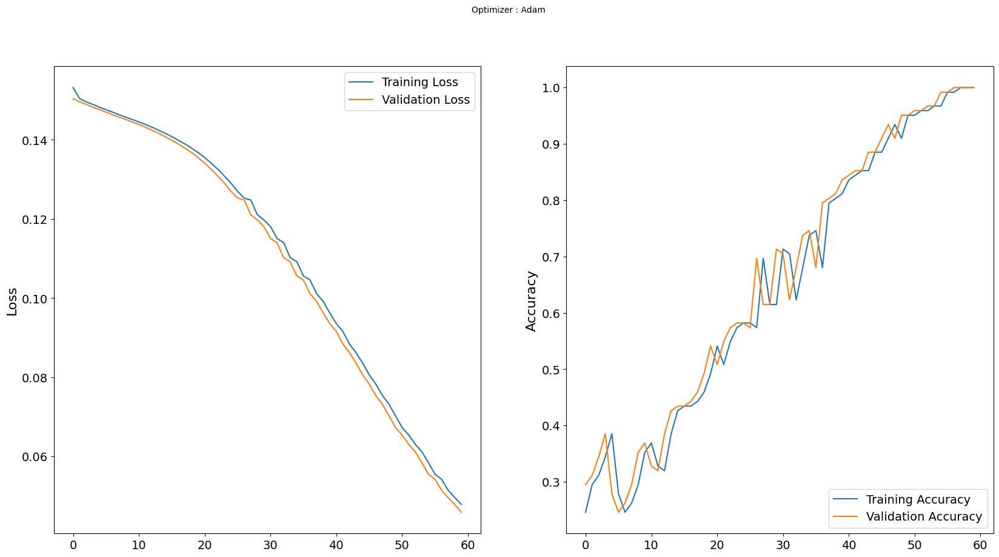

In [34]:
print_acc(lstmhistory)

## Saving LSTM Model

In [36]:
model.save("lstmmodel.h5")

In [37]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = tf.keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = tf.keras.layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = tf.keras.layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = tf.keras.layers.LayerNormalization(epsilon=1e-6)(res)
    x = tf.keras.layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = tf.keras.layers.Dropout(dropout)(x)
    x = tf.keras.layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    return x + res

In [38]:
def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    #x = tf.keras.layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = tf.keras.layers.Dense(dim, activation="relu", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05), 
                                    bias_initializer='zeros',
                                    kernel_regularizer=tf.keras.regularizers.L1L2(l1=1e-5, l2=1e-4), 
                                    bias_regularizer=tf.keras.regularizers.L2(1e-4), 
                                    activity_regularizer=tf.keras.regularizers.L2(1e-5))(x)
        x = tf.keras.layers.Dropout(mlp_dropout)(x)
    outputs = tf.keras.layers.Dense(6, activation="softmax")(x)
    return tf.keras.Model(inputs, outputs)

In [40]:
input_shape = X_train.shape[1:]

model = build_model(
    input_shape,
    head_size=256,
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    mlp_dropout=0.4,
    dropout=0.7,
)

model.compile(
    loss = tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=["accuracy"],
)
print(model.summary())

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 61, 71)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 61, 71)    │        142 │ input_layer_2[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 61, 71)    │    293,959 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_14          │ (None, 61, 71)    │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 61, 71)    │          0 │ dropout_14[0][0], │
│                     │                   │            │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 61, 71)    │        142 │ add_8[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 61, 4)     │        288 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_15          │ (None, 61, 4)     │          0 │ conv1d_8[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 61, 71)    │        355 │ dropout_15[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 61, 71)    │          0 │ conv1d_9[0][0],   │
│                     │                   │            │ add_8[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 61, 71)    │        142 │ add_9[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 61, 71)    │    293,959 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_17          │ (None, 61, 71)    │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_10 (Add)        │ (None, 61, 71)    │          0 │ dropout_17[0][0], │
│                     │                   │            │ add_9[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 61, 71)    │        142 │ add_10[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 61, 4)     │        288 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 61, 4)     │          0 │ conv1d_10[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 61, 71)    │        355 │ dropout_18[0][0]

 Total params: 1,189,534 (4.54 MB)

 Trainable params: 1,189,534 (4.54 MB)

 Non-trainable params: 0 (0.00 B)

None


In [41]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=False, to_file="transformermodel.png")

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [42]:
trans_history = model.fit(
    X_train,
    y_train,
    validation_data=(X_test, y_test),
    epochs=800,
    verbose=0
)

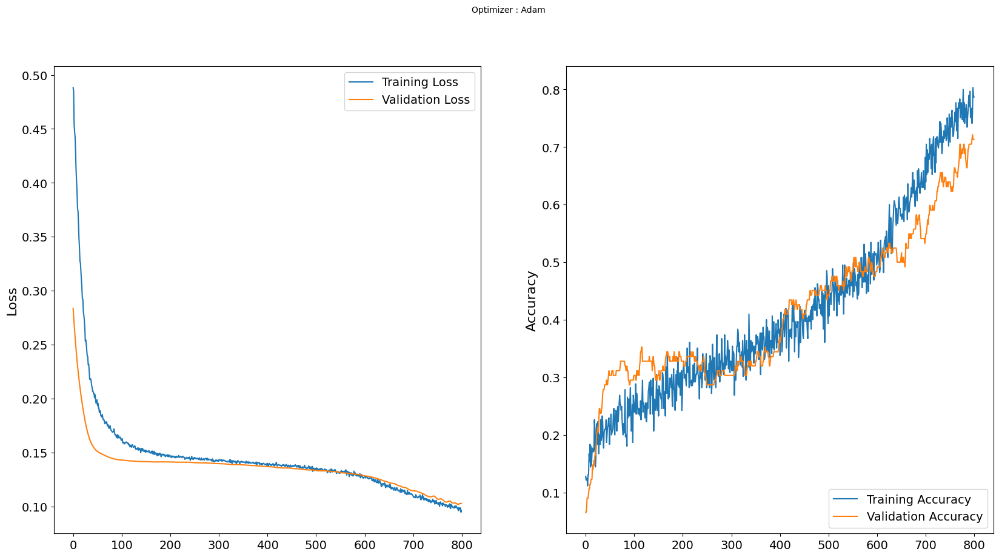

In [43]:
print_acc(trans_history)